### Перенос стиля [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576)

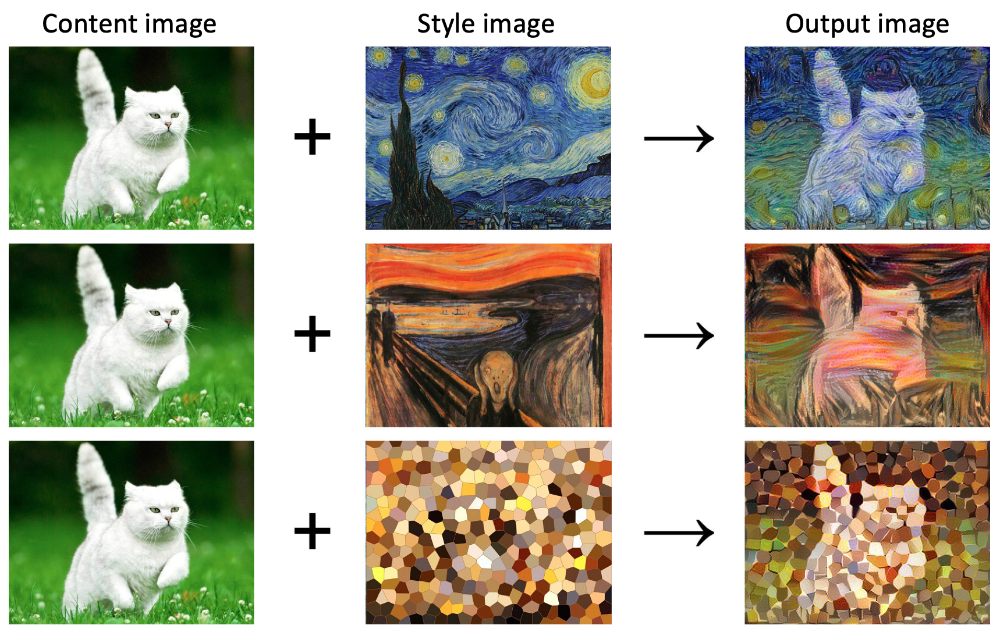

### Формальная постановка

У нас есть исходное изображение content. Мы бы хотели получить такое же изображение, но чтобы оно было в другом стиле (см. картинку). Чтобы реализовать это посмотрим какие части нейронной сети отвечают за контент и стиль.

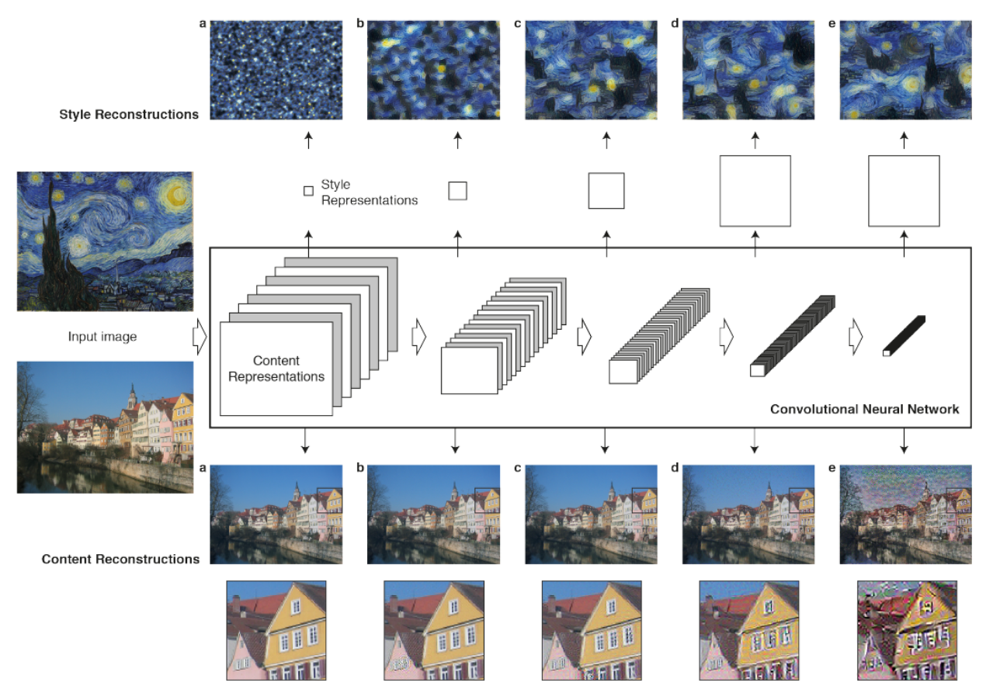

В обученной сети начальные слои отвечают за текстуры, простые цвета и т.д. Но с увеличением глубины нейронная сеть начинает распознавать более сложные паттерны, которые отвечают за содержание изображения

In [1]:
import os
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import cv2
import glob
import pandas as pd

from torchvision import transforms
from PIL import Image
from tqdm import tqdm
from skimage import filters, restoration
from matplotlib import pyplot as plt


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Загружаем предобуенную VGG модель, которую будем использовать для получения признакового описания

In [3]:
vgg = torchvision.models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)

vgg.to(device);

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:03<00:00, 175MB/s]


In [4]:
def get_features(image, model, layers=None):
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}

    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            if image.size(0) != 1:
                features[layers[name]] = torch.mean(x, dim=0, keepdims=True)
            else:
                features[layers[name]] = x
    return features

def im_convert(tensor):
    """ Display a tensor as an image. """

    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze(0)
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

`Content loss `- функция, которая выдает взвешенное контентное расстояние для выхода отдельного слоя сетки. На вход она получает фичамапу входа $X$ со слоя $L$ - $F_{XL}$ и считает расстояние от $X$ до $C$ (в финальном лоссе ещё на вес умножим). Но понятное дело расстояние будем считать не до самой $C$, а до её представления на этом же слое - $F_{CL}$.

То есть $D_S = ‖F_{XL}−F_{CL}‖^2$ и легко считается с помощью `pytorch`.

В сети для переноса стиля подсчет лосса - операция внутренняя, он считается по ходу движения $X$ через сеть, а значит на выход пойдет просто инпут

`Style loss` в целом похож на `Content` - он тоже будет жить между слоями и считать разницу между $N$-м представлением стиля и входа. Но здесь разницу мы будем считать между матрицами Грама $G_{XL}$.

Как мы знаем, матрица Грама - это просто произведение $AA^T$. Для нашего кейса будем считать матрицу Грама для решейпнутых представлений $\hat{F}_{XL}$. Зачем она тут? Базово, мы хотим чтобы хорошо воспроизводились корреляции пар фичей, которые мы наблюдаем в картинке стиля.

Как получаем $\hat{F}_{XL}$: $F_{XL}$ мы решейпим к виду $K\times N$, где $K$ - число фичамап (каналов) на слое $L$, а $N$ - длина любой векторизованной (`flatten`) фичамапы. То есть каждая строка $\hat{F}_{XLi}$ - это `flatten` $i$-ая фичамапа.

В конце каждый элемент матрицы Грама надо нормализовать - поделить на число элементов в матрице, так мы не будем иметь проблем ни с какой размерностью фичамап.


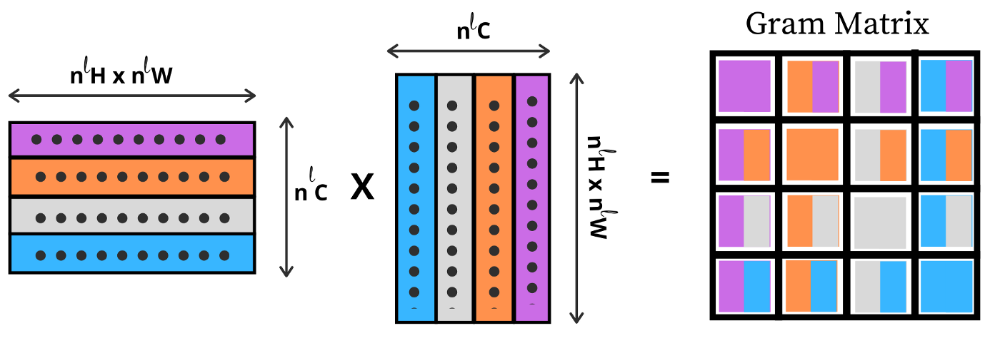

### Процесс переноса стиля:

1. **Предобученная нейронная сеть**:
   - Используется предобученная нейронная сеть (например, VGG-19), которая уже обучена на задаче классификации изображений. Веса этой сети фиксированы и не изменяются в процессе переноса стиля.

2. **Извлечение признаков**:
   - Предобученная сеть используется для извлечения признаков из картинок содержания и стиля. Эти признаки извлекаются на разных уровнях сети.

3. **Вычисление матриц Грама**:
   - Матрицы Грама вычисляются для признаков картинок стиля на разных уровнях сети. Эти матрицы представляют стиль картинок.

4. **Оптимизация**:
   - Начальная картинка (обычно белый шум или копия картинки содержания) оптимизируется с использованием градиентного спуска. В процессе оптимизации изменяются пиксели начальной картинки, а не веса нейронной сети.
   - Функция потерь включает два компонента: потери содержания и потери стиля. Эти потери вычисляются на основе признаков, извлеченных из начальной картинки, картинки содержания и картинки стиля.

### Функция потерь:

$$ L_{\text{total}} = \alpha L_{\text{content}} + \beta L_{\text{style}} $$

где:
- $ L_{\text{content}} $ — потери содержания.
- $ L_{\text{style}} $ — потери стиля.
- $ \alpha $ и $ \beta $ — гиперпараметры, которые определяют вклад каждого компонента в общую функцию потерь.

### Потери содержания:

$$ L_{\text{content}} = \frac{1}{2} \sum_{i,j} (F_{ij} - P_{ij})^2 $$

где:
- $ F $ — признаки начальной картинки.
- $ P $ — признаки картинки содержания.

### Потери стиля:

$ L_{\text{style}} = \sum_{l} w_l E_l $

где:
- $ E_l $ — разница между матрицами Грама начальной картинки и картинки стиля на уровне $ l $.
- $ w_l $ — весовые коэффициенты для каждого уровня сети.

In [5]:
# gram matrix and loss
class GramMatrix(nn.Module):
    def forward(self, input):
        b, d, h, w = input.size()
        img = input.view(b, d, h*w)
        G = torch.einsum("bij, bkj->bik", img, img) / h / w
        return G


class GramMSELoss(nn.Module):
    def forward(self, input, target):
        gram_loss = torch.norm(input - target, dim=(1, 2))
        return gram_loss

In [6]:
img_size = 512
img_transform = transforms.Compose([
                    transforms.ToTensor(),
                    transforms.Normalize((0.485, 0.456, 0.406),
                                            (0.229, 0.224, 0.225))])

In [7]:
style_layers = {'0': 'conv1_1',
                '5': 'conv2_1',
                '10': 'conv3_1',
                '19': 'conv4_1',
                '28': 'conv5_1',
                }
content_layers = {'21': 'conv4_2'}

In [8]:
idx2layer = list(style_layers.values()) + list(content_layers.values())

In [9]:
def prepare_for_train(content_path, style_path, img_size=512, vgg_size=224):
    content_img = Image.open(content_path).convert('RGB')
    style_img = Image.open(style_path).convert('RGB')

    if content_img.size[0] > img_size or content_img.size[1] > img_size:
        content_img = transforms.Resize(img_size)(content_img)

    style_img = transforms.Resize(img_size)(style_img)
    c_img = img_transform(content_img).unsqueeze(0).to(device)
    s_img = img_transform(style_img).unsqueeze(0).to(device)

    content_image = get_features(c_img, vgg, content_layers)
    style_image = get_features(s_img, vgg, style_layers)
    style_gram = {}
    for layer in style_image:
        style_gram[layer] = GramMatrix()(style_image[layer])

    return c_img, content_image, style_gram

In [10]:
from google.colab import files

In [12]:
uploaded = files.upload()

Saving breaking_bad.jpg to breaking_bad.jpg


In [16]:
uploaded = files.upload()

Saving star_night.jpg to star_night.jpg


Изображение, на которое хотим наложить стиль:

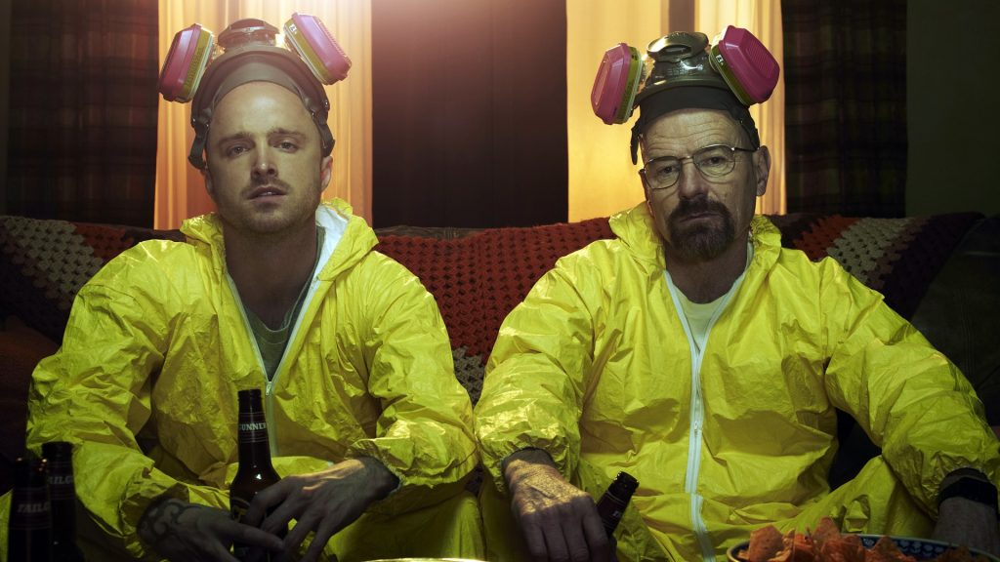

In [14]:
Image.open('/content/breaking_bad.jpg')

Изображение со стилем ван Гог:

In [17]:
Image.open('/content/star_night.jpg')

Output hidden; open in https://colab.research.google.com to view.

In [18]:
loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
style_weights = [1e4/n**2 for n in [64,128,256,512,512]]

content_weights = [1e-1]
tv_weights = [1e-2]
weights = style_weights + content_weights + tv_weights

content_path = '/content/breaking_bad.jpg'
style_path = '/content/star_night.jpg'

c_img, content_image, style_gram = prepare_for_train(content_path, style_path)
#run style transfer
max_iter = 2000
optim_image = c_img.clone().requires_grad_()
optimizer = torch.optim.LBFGS([optim_image], lr=1e0, history_size=3, max_iter=50)


run = [0]
while run[0] <= max_iter:
    def closure():
        optim_image.data.clamp_(-2.1179, 2.2489)
        style_loss = 0.0
        content_loss = 0.0
        grad = 0.0

        optimizer.zero_grad()

        target_content = get_features(optim_image, vgg, content_layers)
        target_style = get_features(optim_image, vgg, style_layers)

        target_gram = {}
        for layer in target_style:
            target_gram[layer] = GramMatrix()(target_style[layer])

        for i in range(len(style_layers)):
            layer = idx2layer[i]
            style_loss = style_loss + weights[i] * loss_fns[i](target_gram[layer], style_gram[layer])

        for i in range(len(content_layers)):
            j = len(style_layers) + i
            layer = idx2layer[j]
            content_loss = content_loss + weights[j] * loss_fns[j](target_content[layer], content_image[layer])
        loss = style_loss + content_loss
        loss.backward()
        run[0] += 1
        if (run[0] + 1) % 100 == 0:
            print(f"Iteration {run[0] + 1}: Loss {loss}")

        return loss

    optimizer.step(closure)

/usr/local/lib/python3.12/dist-packages/torch/optim/lbfgs.py:457: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  loss = float(closure())


Iteration 100: Loss tensor([38.8646], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 200: Loss tensor([16.0672], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 300: Loss tensor([11.8758], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 400: Loss tensor([9.6026], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 500: Loss tensor([8.5165], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 600: Loss tensor([7.1582], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 700: Loss tensor([6.4290], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 800: Loss tensor([6.0121], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 900: Loss tensor([5.8670], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1000: Loss tensor([5.7574], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1100: Loss tensor([5.4863], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1200: Loss tensor([5.2697], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1300: Loss tensor([5.1885], device='cuda:0', gra

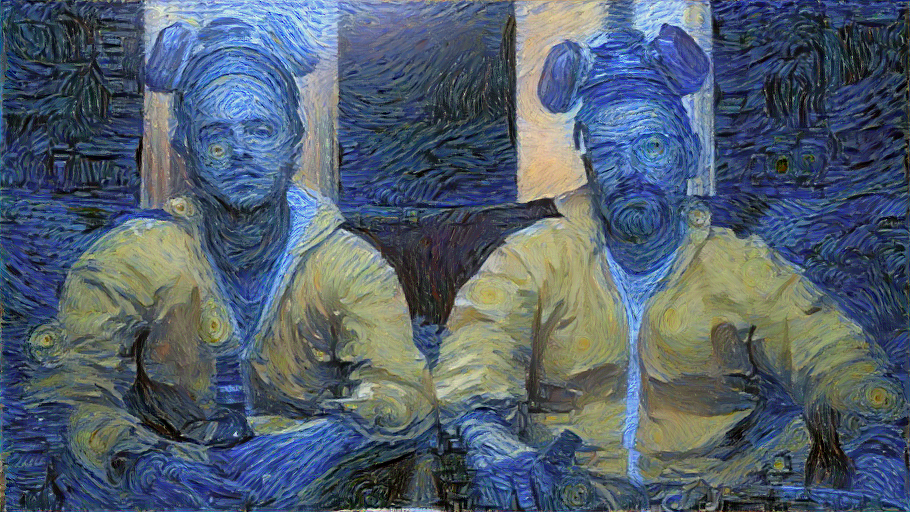

In [19]:
tok = im_convert(optim_image)
tok = (tok - tok.min()) / (tok.max() - tok.min()) * 255
tok = tok.astype(np.uint8)
Image.fromarray(tok)

Еще несколько примеров с другими стилями:

In [ ]:
uploaded = files.upload()

Saving style.jpg to style.jpg


Винтажный стиль изображения

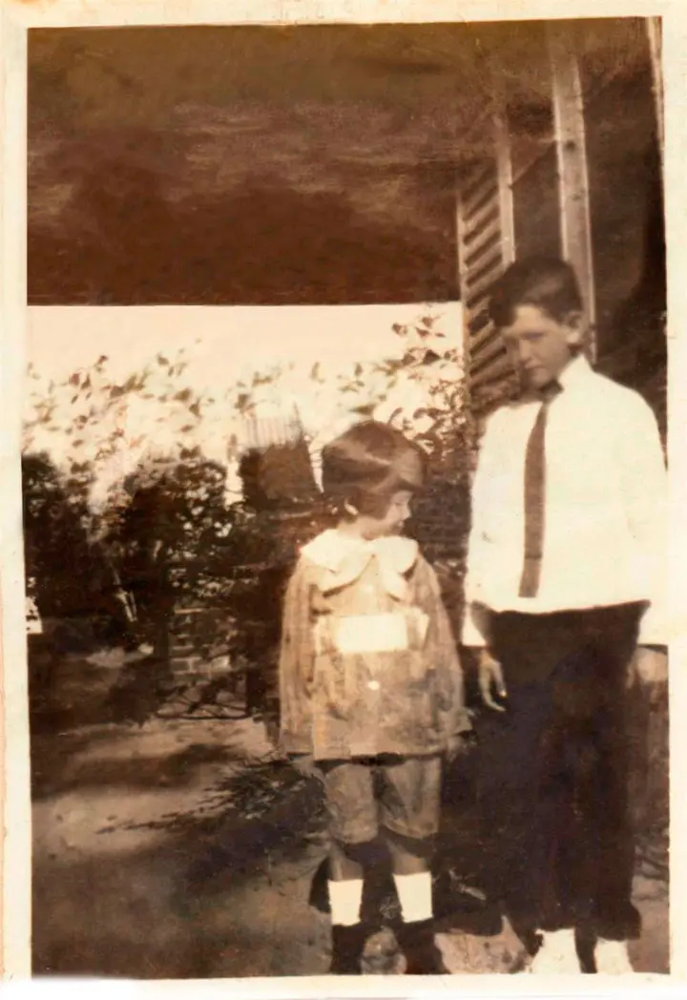

In [ ]:
Image.open('/content/style.jpg')

In [ ]:
loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
style_weights = [1e4/n**2 for n in [64,128,256,512,512]]

content_weights = [1e-1]
tv_weights = [1e-2]
weights = style_weights + content_weights + tv_weights

content_path = '/content/roasting_phd.jpg'
style_path = '/content/style.jpg'

c_img, content_image, style_gram = prepare_for_train(content_path, style_path)
#run style transfer
max_iter = 2000
optim_image = c_img.clone().requires_grad_()
optimizer = torch.optim.LBFGS([optim_image], lr=1e0, history_size=3, max_iter=50)


run = [0]
while run[0] <= max_iter:
    def closure():
        optim_image.data.clamp_(-2.1179, 2.2489)
        style_loss = 0.0
        content_loss = 0.0
        grad = 0.0

        optimizer.zero_grad()

        target_content = get_features(optim_image, vgg, content_layers)
        target_style = get_features(optim_image, vgg, style_layers)

        target_gram = {}
        for layer in target_style:
            target_gram[layer] = GramMatrix()(target_style[layer])

        for i in range(len(style_layers)):
            layer = idx2layer[i]
            style_loss = style_loss + weights[i] * loss_fns[i](target_gram[layer], style_gram[layer])

        for i in range(len(content_layers)):
            j = len(style_layers) + i
            layer = idx2layer[j]
            content_loss = content_loss + weights[j] * loss_fns[j](target_content[layer], content_image[layer])
        loss = style_loss + content_loss
        loss.backward()
        run[0] += 1
        if (run[0] + 1) % 100 == 0:
            print(f"Iteration {run[0] + 1}: Loss {loss}")

        return loss

    optimizer.step(closure)

Iteration 100: Loss tensor([17.7942], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 200: Loss tensor([14.2977], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 300: Loss tensor([12.8282], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 400: Loss tensor([11.9091], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 500: Loss tensor([10.9275], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 600: Loss tensor([10.5221], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 700: Loss tensor([10.2181], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 800: Loss tensor([9.6542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 900: Loss tensor([9.2471], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1000: Loss tensor([8.8785], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1100: Loss tensor([8.6028], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1200: Loss tensor([8.3872], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1300: Loss tensor([8.2864], device='cuda:0',

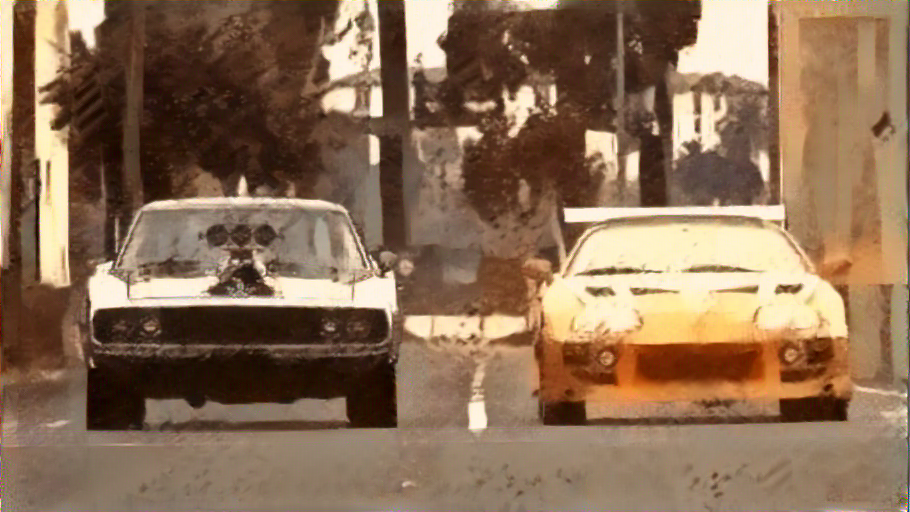

In [ ]:
tok = im_convert(optim_image)
tok = (tok - tok.min()) / (tok.max() - tok.min()) * 255
tok = tok.astype(np.uint8)
Image.fromarray(tok)

In [ ]:
uploaded = files.upload()

Saving mosaic.jpg to mosaic.jpg


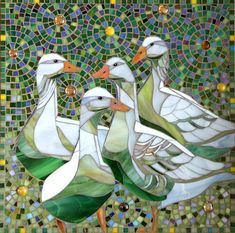

In [ ]:
Image.open('/content/mosaic.jpg')

In [ ]:
loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
style_weights = [1e4/n**2 for n in [64,128,256,512,512]]

content_weights = [1e-1]
tv_weights = [1e-2]
weights = style_weights + content_weights + tv_weights

content_path = '/content/roasting_phd.jpg'
style_path = '/content/mosaic.jpg'

c_img, content_image, style_gram = prepare_for_train(content_path, style_path)
#run style transfer
max_iter = 2000
optim_image = c_img.clone().requires_grad_()
optimizer = torch.optim.LBFGS([optim_image], lr=1e0, history_size=3, max_iter=50)


run = [0]
while run[0] <= max_iter:
    def closure():
        optim_image.data.clamp_(-2.1179, 2.2489)
        style_loss = 0.0
        content_loss = 0.0
        grad = 0.0

        optimizer.zero_grad()

        target_content = get_features(optim_image, vgg, content_layers)
        target_style = get_features(optim_image, vgg, style_layers)

        target_gram = {}
        for layer in target_style:
            target_gram[layer] = GramMatrix()(target_style[layer])

        for i in range(len(style_layers)):
            layer = idx2layer[i]
            style_loss = style_loss + weights[i] * loss_fns[i](target_gram[layer], style_gram[layer])

        for i in range(len(content_layers)):
            j = len(style_layers) + i
            layer = idx2layer[j]
            content_loss = content_loss + weights[j] * loss_fns[j](target_content[layer], content_image[layer])
        loss = style_loss + content_loss
        loss.backward()
        run[0] += 1
        if (run[0] + 1) % 100 == 0:
            print(f"Iteration {run[0] + 1}: Loss {loss}")

        return loss

    optimizer.step(closure)

Iteration 100: Loss tensor([30.4914], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 200: Loss tensor([20.2717], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 300: Loss tensor([15.8320], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 400: Loss tensor([11.9571], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 500: Loss tensor([10.1314], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 600: Loss tensor([9.0272], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 700: Loss tensor([8.2901], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 800: Loss tensor([7.7714], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 900: Loss tensor([7.5257], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1000: Loss tensor([7.2700], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1100: Loss tensor([6.9779], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1200: Loss tensor([6.5251], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 1300: Loss tensor([6.3966], device='cuda:0', g

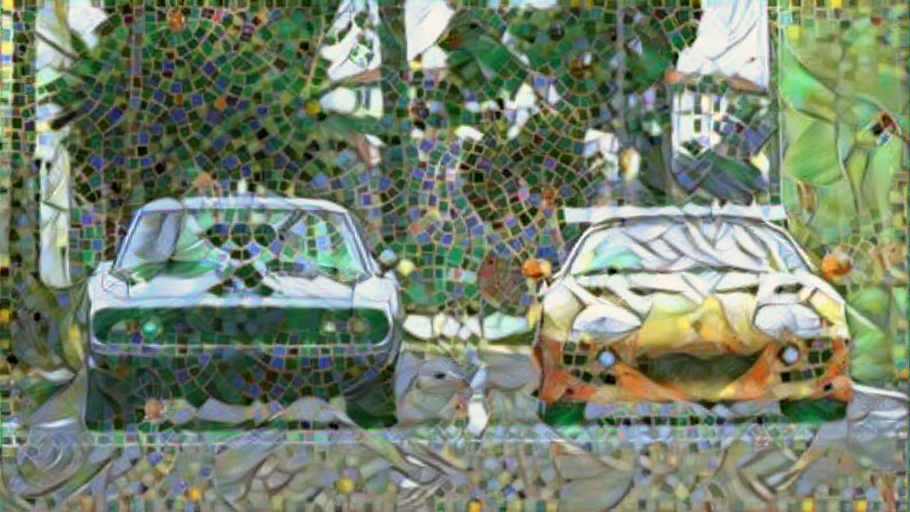

In [ ]:
tok = im_convert(optim_image)
tok = (tok - tok.min()) / (tok.max() - tok.min()) * 255
tok = tok.astype(np.uint8)
Image.fromarray(tok)

In [ ]:
uploaded = files.upload()

Saving bablo.jpg to bablo.jpg


In [ ]:
uploaded = files.upload()

Saving scream.jpg to scream.jpg


In [ ]:
loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
style_weights = [1e4/n**2 for n in [64,128,256,512,512]]

content_weights = [1e-1]
tv_weights = [1e-2]
weights = style_weights + content_weights + tv_weights

content_path = '/content/bablo.jpg'
style_path = '/content/scream.jpg'

c_img, content_image, style_gram = prepare_for_train(content_path, style_path)
#run style transfer
max_iter = 200
optim_image = c_img.clone().requires_grad_()
optimizer = torch.optim.LBFGS([optim_image], lr=1e0, history_size=3, max_iter=50)


run = [0]
while run[0] <= max_iter:
    def closure():
        optim_image.data.clamp_(-2.1179, 2.2489)
        style_loss = 0.0
        content_loss = 0.0
        grad = 0.0

        optimizer.zero_grad()

        target_content = get_features(optim_image, vgg, content_layers)
        target_style = get_features(optim_image, vgg, style_layers)

        target_gram = {}
        for layer in target_style:
            target_gram[layer] = GramMatrix()(target_style[layer])

        for i in range(len(style_layers)):
            layer = idx2layer[i]
            style_loss = style_loss + weights[i] * loss_fns[i](target_gram[layer], style_gram[layer])

        for i in range(len(content_layers)):
            j = len(style_layers) + i
            layer = idx2layer[j]
            content_loss = content_loss + weights[j] * loss_fns[j](target_content[layer], content_image[layer])
        loss = style_loss + content_loss
        loss.backward()
        run[0] += 1
        if (run[0] + 1) % 100 == 0:
            print(f"Iteration {run[0] + 1}: Loss {loss}")

        return loss

    optimizer.step(closure)

Iteration 100: Loss tensor([25.1263], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 200: Loss tensor([17.0915], device='cuda:0', grad_fn=<AddBackward0>)


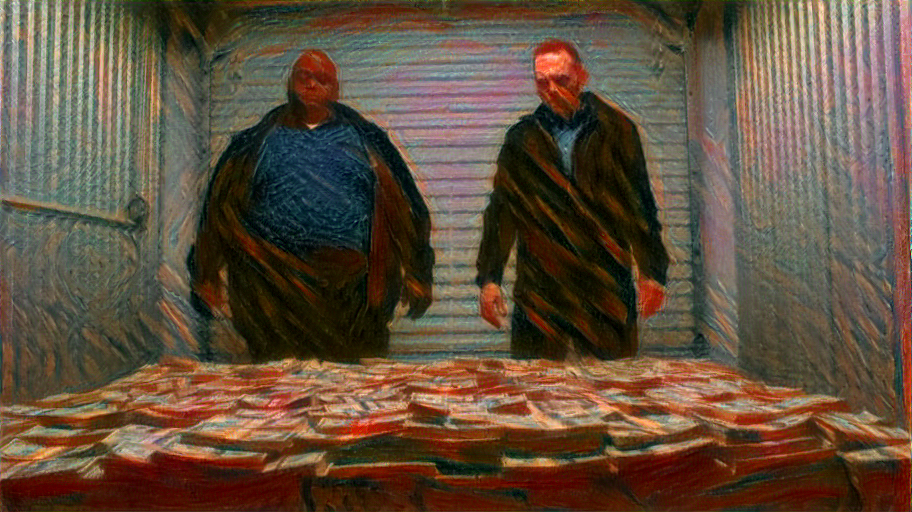

In [ ]:
tok = im_convert(optim_image)
tok = (tok - tok.min()) / (tok.max() - tok.min()) * 255
tok = tok.astype(np.uint8)
Image.fromarray(tok)